In [1]:
# Feel free to add dependencies, but make sure that they are included in environment.yml

#disable some annoying warnings
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

#plots the figures in place instead of a new window
%matplotlib inline

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import altair as alt
from altair import datum
alt.data_transformers.disable_max_rows()

from sklearn import manifold
from openTSNE import TSNE
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import ParameterGrid
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

c:\Programs\envs\xai_proj_space\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<h1>Read excel file</h1>

In [2]:
# Install this to be able to use pd.read_excel
# pip install openpyxl

In [3]:
# Load dataset
# data = pd.read_excel('merged_games_with_scores.xlsx') # old, not yet final dataset
data = pd.read_excel('merged_games_with_scores_final_new.xlsx')

In [4]:
# Selecting only the board state columns for dimensionality reduction
board_state_columns = data.loc[:, 'aa':'ss']

info_cols=[col for col in data.columns if col not in board_state_columns]

In [5]:
info_cols

['game_id',
 'move_id',
 'color',
 'winner_color',
 'winner_score',
 'result',
 'rules',
 'handicap',
 'starter_player',
 'step_count',
 'level',
 'Rank',
 'Player',
 'Date',
 'Our_players_colour',
 'Area score',
 'Area score of opponent',
 'Area_winner_color',
 'Area_result',
 'Territory_score',
 'Territory_score_of_opponent',
 'Territory_winner_color',
 'Territory_result']

In [6]:


# Selecting only the board state columns for dimensionality reduction
board_state_columns = data.loc[:, 'aa':'ss']
# player_info_columns for merged_games_with_scores.xlsx
# player_info_columns = data[['game_id', 'move_id', 'color', 'our_players_color', 'winner_color', 'winner_score', 'result', 'rules', 'handicap', 'starter_player', 'step_count', 'level', 'Rank', 'Area score', 'Area score of opponent', 'Area_winner_color', 'Area result', 'Territory score', 'Territory score of opponent', 'Territory_winner_color', 'Territory result']]  

# player_info_columns for merged_games_with_scores_final.xlsx
player_info_columns = data[info_cols]  


In [7]:
data.Player

0       FrayedKnot
1       FrayedKnot
2       FrayedKnot
3       FrayedKnot
4       FrayedKnot
           ...    
9750          tmat
9751          tmat
9752          tmat
9753          tmat
9754          tmat
Name: Player, Length: 9755, dtype: object

In [8]:
board_state_columns

,aa,ab,ac,ad,ae,af,ag,ah,ai,aj,...,sj,sk,sl,sm,sn,so,sp,sq,sr,ss
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9751,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9752,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9753,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
player_info_columns

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,...,Date,Our_players_colour,Area score,Area score of opponent,Area_winner_color,Area_result,Territory_score,Territory_score_of_opponent,Territory_winner_color,Territory_result
0,1,1,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5"
1,1,2,black,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5"
2,1,3,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5"
3,1,4,black,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5"
4,1,5,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,"1,5",4.5,3.0,W,"1,5"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5"
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5"
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5"
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,"360,5",0.5,356.0,B,"355,5"


<h1>PCA</h1> 

KEEP IT

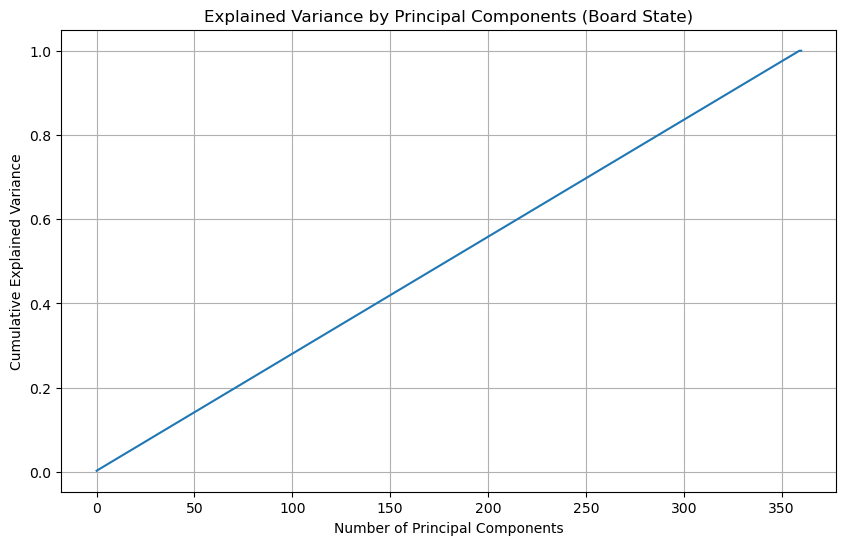

Explained variance by each component: [0.00278106 0.00278098 0.00278027 0.00277979 0.00277972 0.00277971
 0.00277958 0.00277955 0.00277954 0.00277947 0.00277943 0.00277942
 0.00277935 0.00277931 0.00277928 0.00277927 0.00277925 0.00277924
 0.00277922 0.0027792  0.00277911 0.00277907 0.00277907 0.00277904
 0.00277901 0.002779   0.00277899 0.00277898 0.00277895 0.00277894
 0.00277892 0.00277891 0.00277888 0.00277888 0.00277887 0.00277884
 0.00277884 0.00277883 0.0027788  0.0027788  0.0027788  0.00277879
 0.00277878 0.00277877 0.00277876 0.00277874 0.00277874 0.00277874
 0.00277873 0.00277872 0.00277871 0.0027787  0.00277869 0.00277869
 0.00277864 0.00277859 0.00277856 0.00277856 0.00277854 0.00277845
 0.00277845 0.00277844 0.00277844 0.00277843 0.0027784  0.00277836
 0.00277836 0.00277836 0.00277835 0.00277832 0.00277832 0.00277832
 0.00277832 0.0027783  0.00277829 0.00277829 0.00277827 0.00277825
 0.00277822 0.00277821 0.0027782  0.00277819 0.00277817 0.00277816
 0.00277813 0.00277813 0

In [10]:
# Standardize the board state data
scaler = StandardScaler()
board_state_scaled = scaler.fit_transform(board_state_columns)

# Apply PCA to the board state columns
pca = PCA()
board_state_pca = pca.fit_transform(board_state_scaled)

# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Principal Components (Board State)')
plt.grid(True)
plt.show()

# Checking how many components explain a significant amount of variance
explained_variance = pca.explained_variance_ratio_

# Summary of PCA
print(f"Explained variance by each component: {explained_variance}")
print(f"Total explained variance: {np.cumsum(explained_variance)}")


<h5>It doesn't make any sense to use PCA on the board states, as no feature (in this case board position) seems to be more important than the others.</h5>

In [11]:
info_cols

['game_id',
 'move_id',
 'color',
 'winner_color',
 'winner_score',
 'result',
 'rules',
 'handicap',
 'starter_player',
 'step_count',
 'level',
 'Rank',
 'Player',
 'Date',
 'Our_players_colour',
 'Area score',
 'Area score of opponent',
 'Area_winner_color',
 'Area_result',
 'Territory_score',
 'Territory_score_of_opponent',
 'Territory_winner_color',
 'Territory_result']

In [12]:
# !!!! winner_score and Rank are excluded here!!!!
# feature names in merged_games_with_scores.xlsx
"""
numerical_features = ['handicap', 'step_count', 
                      'Area score', 'Area score of opponent', 'Area result', 'Territory score', 
                      'Territory score of opponent', 'Territory result']
categorical_features = ['game_id', 'move_id', 'color', 'Our_players_colour', 
                        'winner_color', 'result', 'rules', 'starter_player', 
                        'level', 'Area_winner_color', 'Territory_winner_color']
"""

# feature names in merged_games_with_scores_final.xlsx
numerical_features = ['handicap', 'step_count', 
                      'Area score', 'Area score of opponent', 'Area_result', 'Territory_score', 
                      'Territory_score_of_opponent', 'Territory_result']
categorical_features = ['game_id', 'move_id', 'color',  'Our_players_colour',
                        'winner_color', 'result', 'rules', 'starter_player', 
                        'level', 'Area_winner_color', 'Territory_winner_color']

# Converting numerical features to numeric (int/float)
for feature in numerical_features:
    player_info_columns[feature] = pd.to_numeric(player_info_columns[feature], errors='coerce')

# Handling any NaN values that result from conversion
# For example, filling NaN values with the mean of the column
player_info_columns[numerical_features] = player_info_columns[numerical_features].fillna(
    player_info_columns[numerical_features].mean()
)

C:\Users\lengyel1lizb08\AppData\Local\Temp\ipykernel_28784\3452410791.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_info_columns[feature] = pd.to_numeric(player_info_columns[feature], errors='coerce')
C:\Users\lengyel1lizb08\AppData\Local\Temp\ipykernel_28784\3452410791.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_info_columns[numerical_features] = player_info_columns[numerical_features].fillna(


In [13]:
all_data = pd.concat([player_info_columns, board_state_columns], axis=1)

In [14]:
all_data

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,...,sj,sk,sl,sm,sn,so,sp,sq,sr,ss
0,1,1,white,white,Time,score,Japanese,4,white,105,...,0,0,0,0,0,0,0,0,0,0
1,1,2,black,white,Time,score,Japanese,4,white,105,...,0,0,0,0,0,0,0,0,0,0
2,1,3,white,white,Time,score,Japanese,4,white,105,...,0,0,0,0,0,0,0,0,0,0
3,1,4,black,white,Time,score,Japanese,4,white,105,...,0,0,0,0,0,0,0,0,0,0
4,1,5,white,white,Time,score,Japanese,4,white,105,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,...,0,0,0,0,0,0,0,0,0,0
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,...,0,0,0,0,0,0,0,0,0,0
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,...,0,0,0,0,0,0,0,0,0,0
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,...,0,0,0,0,0,0,0,0,0,0


# KEEP ALL 3

<h3>These results are for our old dataset (merged_games_with_scores.xlsx)</h3>
<h4>PC 1 - focuses on overall scoring metrics</h4>
The score-related features (Area score, Territory score, and their opponent counterparts) seem highly important. --> they affect game outcomes or player performance most significantly (of course :D )

<h4>PC 2 - focuses on progression of the game</h4>
!!!!! The step_count and handicap features are crucial here. Consider analyzing how the length of the game and the handicap setting influence the strategies and scores of players.

<h4>PC 3 - focuses on the initial game conditions</h4>
!!!!!Handicap and the identity of the starter_player (black or white) are important features to analyze. Investigate how initial conditions and starting player influence the final scores and outcomes.

<h4>PC 4 - focuses on territorial aspects of the game</h4>
!!!!!Analyzing territory-based strategies and how they interact with initial game conditions (like handicap) could provide deeper insights into player performance.

<h4>PC 5 - focuses on game progression and duration</h4>
!!!!!Investigating how game duration affects strategic decisions and whether certain player levels or ranks are associated with longer, more strategically complex games could yield interesting findings.

<h3>These results are for our final dataset (merged_games_with_scores_final.xlsx)</h3>
<h4>PC 1 - on opponent and game outcome</h4>
!!!!!The inclusion of level_1 indicates that there could be a specific level effect, possibly influencing or being influenced by these score metrics.

<h4>PC 2 - focuses on handicap and game outcomes</h4>
This component emphasizes handicap settings and their impact on the final game outcomes. The handicap feature has a strong positive loading, suggesting that it plays a crucial role in game dynamics.
The negative relationship between Territory_score, Territory_result, and Area_result indicates that higher handicaps might negatively affect the territory-based outcomes for the player starting with the handicap.
The feature result_resign implies that resignation outcomes might correlate with handicap settings, hinting at games that end prematurely due to significant score discrepancies.

<h4>PC 3 - focuses on step count and player roles</h4>
The relationship between step_count and Area score of opponent suggests that the number of moves made during the game influences or is influenced by the opponent's area score.
The negative and positive loadings of starter_player_white and starter_player_black reflect the impact of the starting player on the game dynamics.

<h4>PC 4 - focuses on handicaps and initial conditions of the game</h4>
This component emphasizes initial game conditions, such as handicap and the player who starts the game (starter_player_white or starter_player_black).
The handicap feature having the highest loading suggests that handicap settings are crucial in defining the game's framework and have a ripple effect on other aspects, like step count and score.
The presence of step_count and score-related features (Territory_score, Area score) indicates that initial conditions influence the game's length and the accumulation of scores.
The mixed loadings for starter_player_white and starter_player_black hint at the importance of player roles and how starting as either black or white affects gameplay.

<h4>PC 5 - focuses on step count and winning color</h4>
This component emphasizes the duration of the game (step_count) and the winning color. The high loading on step_count indicates that the length of the game is a critical factor in the outcomes.
The winner_color_white and winner_color_black features suggest a correlation between game duration and the color of the winning player.
The Area_winner_color_W, Area_winner_color_B, Territory_winner_color_W, and Territory_winner_color_B features point to the strategic aspects of area and territory control that determine the winner's color. This implies that longer games may have more complex area and territory strategies influencing the final outcome.
Overall, this component captures the strategic depth of longer games and how different player levels or strategies might be associated with game duration and winning color.

C:\Users\lengyel1lizb08\AppData\Local\Temp\ipykernel_28784\2670326579.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_info_columns[feature] = pd.to_numeric(player_info_columns[feature], errors='coerce')
C:\Users\lengyel1lizb08\AppData\Local\Temp\ipykernel_28784\2670326579.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_info_columns[numerical_features] = player_info_columns[numerical_features].fillna(



Most important features for each principal component:

Principal Component 1:
  Territory_score_of_opponent: 0.4370
  Area score of opponent: 0.4171
  Area score: -0.4087
  Territory_result: 0.3655
  Area_result: 0.3652
  Territory_score: -0.3217
  level_1: 0.1544
  step_count: 0.1048
  level_3: -0.1001
  winner_color_black: 0.0791

Principal Component 2:
  handicap: 0.4794
  Territory_score: -0.4131
  Territory_result: -0.4060
  Area_result: -0.4038
  Area score: -0.3163
  Area score of opponent: 0.1760
  starter_player_black: -0.1341
  starter_player_white: 0.1341
  result_resign: 0.1208
  result_score: -0.1208

Principal Component 3:
  step_count: 0.6541
  Area score of opponent: 0.2694
  Area_winner_color_B: -0.2277
  Area_winner_color_W: 0.2277
  Territory_winner_color_B: -0.2100
  Territory_winner_color_W: 0.2100
  handicap: -0.1981
  starter_player_white: -0.1961
  starter_player_black: 0.1961
  rules_Japanese: -0.1753

Principal Component 4:
  handicap: 0.6004
  starter_player

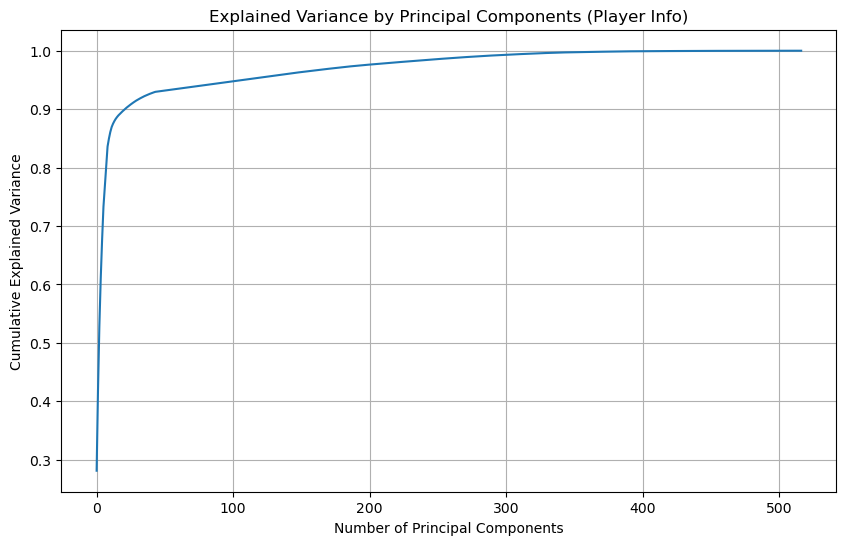

In [15]:
"""
numerical_features = ['handicap', 'step_count', 
                      'Area score', 'Area score of opponent', 'Area result', 'Territory score', 
                      'Territory score of opponent', 'Territory result']
categorical_features = ['game_id', 'move_id', 'color', 'our_players_color', 
                        'winner_color', 'result', 'rules', 'starter_player', 
                        'level', 'Area_winner_color', 'Territory_winner_color']
"""

numerical_features = ['handicap', 'step_count', 
                      'Area score', 'Area score of opponent', 'Area_result', 'Territory_score', 
                      'Territory_score_of_opponent', 'Territory_result']
categorical_features = ['game_id', 'move_id', 'color',  'Our_players_colour',
                        'winner_color', 'result', 'rules', 'starter_player', 
                        'level', 'Area_winner_color', 'Territory_winner_color']

# Converting numerical features to numeric (int/float)
for feature in numerical_features:
    player_info_columns[feature] = pd.to_numeric(player_info_columns[feature], errors='coerce')

# Handling any NaN values that result from conversion
# For example, filling NaN values with the mean of the column
player_info_columns[numerical_features] = player_info_columns[numerical_features].fillna(
    player_info_columns[numerical_features].mean()
)

# Preprocessing: One-Hot Encoding for categorical features and Standardization for numerical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(), categorical_features)
    ]
)

# Create a pipeline for PCA
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('pca', PCA())
])

# Apply PCA to the player info columns
player_info_pca = pipeline.fit_transform(player_info_columns)

# Extract PCA component and explained variance
pca = pipeline.named_steps['pca']
explained_variance = pca.explained_variance_ratio_

# Get feature names from the preprocessor
# Note: OneHotEncoder generates multiple columns for each category, so we need to extract all feature names
onehot_feature_names = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features)
all_feature_names = numerical_features + list(onehot_feature_names)

# Analyze the PCA components to see the most important features
pca_components = pca.components_

# Print out the most important features for each principal component
print("\nMost important features for each principal component:\n")
for i, component in enumerate(pca_components):
    # Get the top features for this component, sorted by the absolute value of their loadings
    important_features = sorted(zip(all_feature_names, component), key=lambda x: abs(x[1]), reverse=True)
    print(f"Principal Component {i + 1}:")
    for feature, loading in important_features[:10]:  # Print top 10 features for each component
        print(f"  {feature}: {loading:.4f}")
    print()

# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_variance))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Principal Components (Player Info)')
plt.grid(True)
plt.show()


Most important features for each principal component:

Principal Component 1:
  Territory_score_of_opponent: 0.4353
  Area score of opponent: 0.4155
  Area score: -0.4080
  Territory_result: 0.3634
  Area_result: 0.3631
  Territory_score: -0.3212
  level_1: 0.1540
  step_count: 0.1034
  level_3: -0.1000
  winner_color_black: 0.0787

Principal Component 2:
  handicap: 0.4756
  Territory_score: -0.4033
  Territory_result: -0.3981
  Area_result: -0.3959
  Area score: -0.3089
  Area score of opponent: 0.1684
  starter_player_white: 0.1349
  starter_player_black: -0.1349
  result_resign: 0.1185
  result_score: -0.1185

Principal Component 3:
  step_count: 0.6281
  Area score of opponent: 0.2561
  Area_winner_color_B: -0.2122
  Area_winner_color_W: 0.2122
  Territory_winner_color_B: -0.1966
  Territory_winner_color_W: 0.1966
  starter_player_white: -0.1692
  starter_player_black: 0.1692
  rules_Japanese: -0.1611
  handicap: -0.1579

Principal Component 4:
  handicap: 0.5044
  starter_player

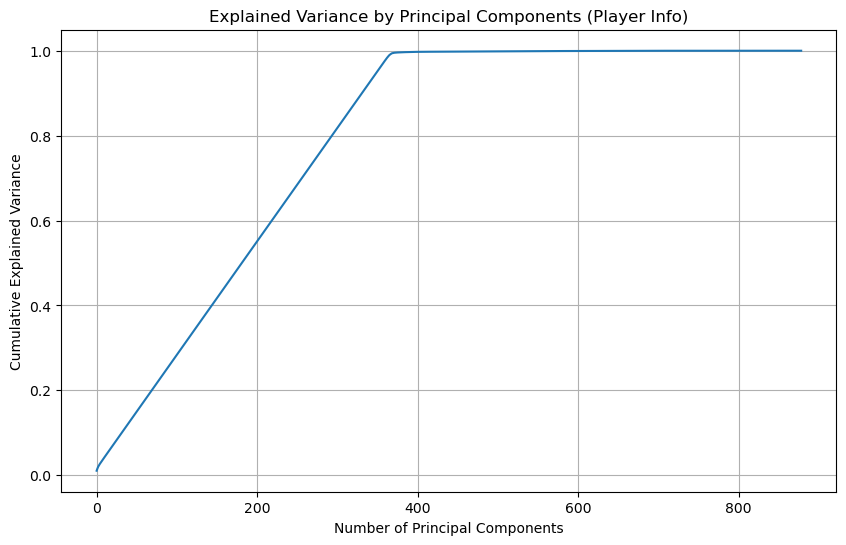

In [16]:

numerical_features.extend(board_state_columns.columns)



# Preprocessing: One-Hot Encoding for categorical features and Standardization for numerical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(), categorical_features)
    ]
)

# Create a pipeline for PCA
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('pca', PCA())
])



# Apply PCA to the player info columns
player_info_pca = pipeline.fit_transform(all_data)

# Extract PCA component and explained variance
pca = pipeline.named_steps['pca']
explained_variance = pca.explained_variance_ratio_

# Get feature names from the preprocessor
# Note: OneHotEncoder generates multiple columns for each category, so we need to extract all feature names
onehot_feature_names = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features)
all_feature_names = numerical_features + list(onehot_feature_names)

# Analyze the PCA components to see the most important features
pca_components = pca.components_

# Print out the most important features for each principal component
print("\nMost important features for each principal component:\n")
for i, component in enumerate(pca_components):
    # Get the top features for this component, sorted by the absolute value of their loadings
    important_features = sorted(zip(all_feature_names, component), key=lambda x: abs(x[1]), reverse=True)
    print(f"Principal Component {i + 1}:")
    for feature, loading in important_features[:10]:  # Print top 10 features for each component
        print(f"  {feature}: {loading:.4f}")
    print()

# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_variance))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Principal Components (Player Info)')
plt.grid(True)
plt.show()

# USE this pca_df for state links

Length of pca_index: 9755
Length of player_info_pca: 9755
Checks begin here...
[1 2 3]
level
2    5677
1    2434
3    1644
Name: count, dtype: int64
[1 2 3]
Checks end here.


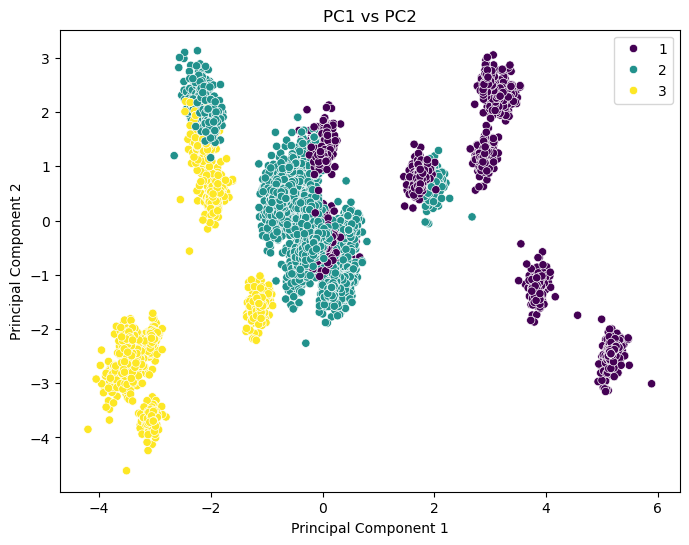

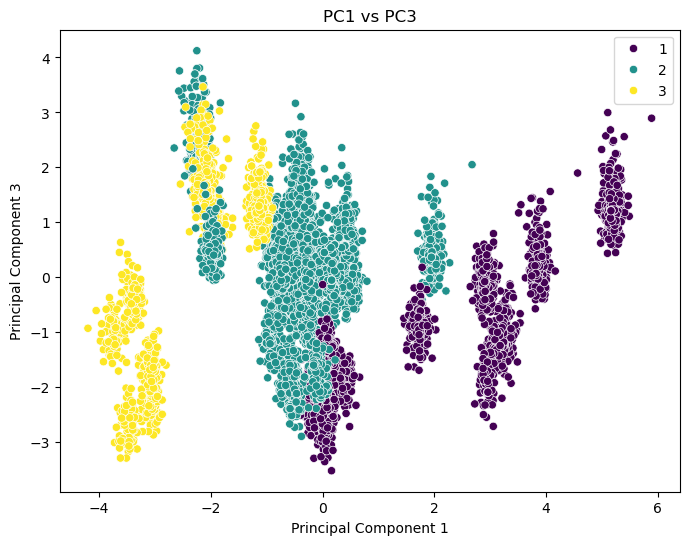

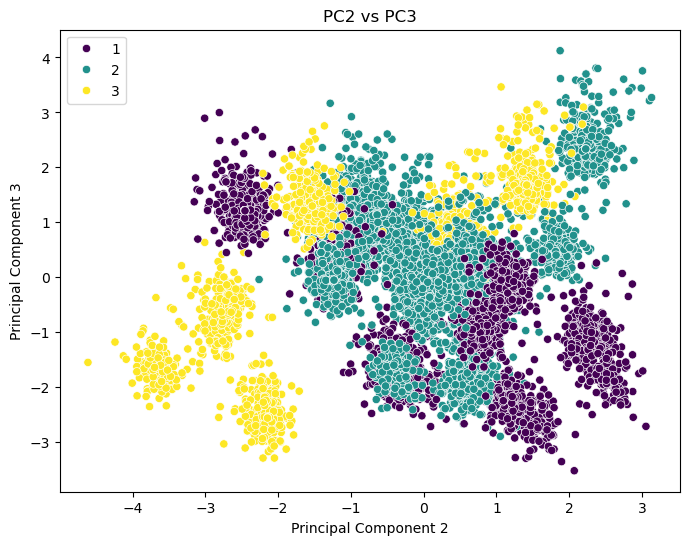

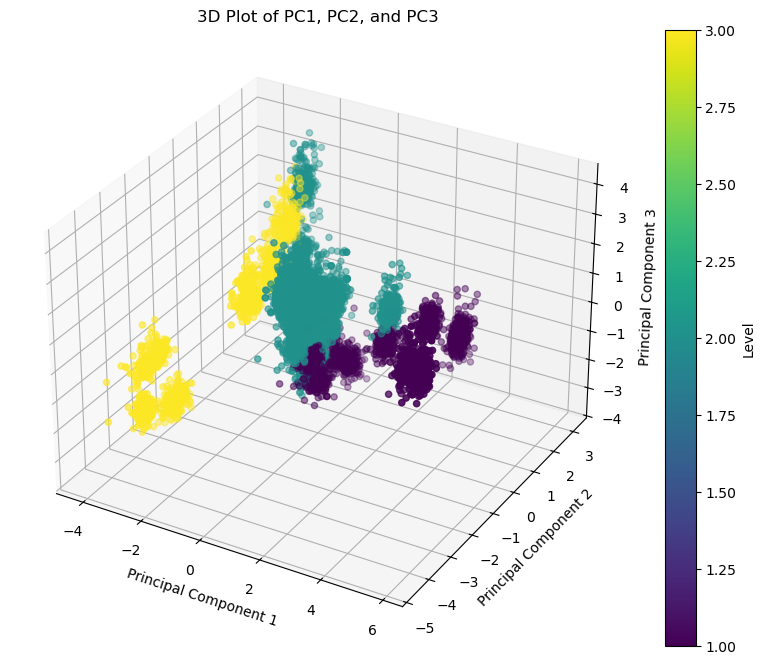

In [17]:
# pca_index corresponds to the entire index of player_info_columns
pca_index = player_info_columns.index

# Check if lengths match
print("Length of pca_index:", len(pca_index))
print("Length of player_info_pca:", len(player_info_pca))

# X_pca_first_3 = pca_components[:, :3]  # Keep only the first 3 columns

# Create a DataFrame for easy handling of PCA components
# pca_df = pd.DataFrame(X_pca_first_3, columns=['PC1', 'PC2', 'PC3'])

# Print pca_df
# print(pca_df)

# Optionally, you can add labels or use some feature for coloring
# For example, using 'winner_color' for coloring (if it's a binary/categorical feature)
# pca_df['level'] = player_info_columns['level'].values  # Adjust to your chosen categorical feature

# Create the pca_df DataFrame using the first 3 principal components
pca_df = pd.DataFrame(player_info_pca[:, :3], columns=['PC1', 'PC2', 'PC3'])

# Use pca_index to get the correct 'level' values from player_info_columns
pca_df['level'] = player_info_columns.loc[pca_index, 'level'].values

# JUST SOME CHECKS
print("Checks begin here...")
print(player_info_columns['level'].unique())
print(player_info_columns['level'].value_counts())
print(pca_df['level'].unique())
print("Checks end here.")

# Plotting PC1 vs PC2
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='level', palette='viridis')
plt.title('PC1 vs PC2')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

# Plotting PC1 vs PC3
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC3', hue='level', palette='viridis')
plt.title('PC1 vs PC3')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend()
plt.show()

# Plotting PC2 vs PC3
plt.figure(figsize=(8, 6))
sns.scatterplot(data=pca_df, x='PC2', y='PC3', hue='level', palette='viridis')
plt.title('PC2 vs PC3')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend()
plt.show()

# 3D Plot of PC1, PC2, and PC3
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(pca_df['PC1'], pca_df['PC2'], pca_df['PC3'], c=pca_df['level'], cmap='viridis')
ax.set_title('3D Plot of PC1, PC2, and PC3')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.colorbar(sc, label='Level')
plt.show()

In [18]:
pca_df

,PC1,PC2,PC3,level
0,-0.315149,1.084037,-2.440193,1
1,-0.261118,0.954512,-2.835723,1
2,-0.202340,0.928186,-2.233128,1
3,-0.205278,1.518438,-2.884055,1
4,-0.240437,1.135438,-2.185350,1
...,...,...,...,...
9750,2.950732,2.775316,-1.544226,1
9751,2.873393,2.413515,-1.660647,1
9752,2.889475,2.509379,-1.875315,1
9753,2.955435,2.618545,-1.894018,1


# KEEP ALL

In [19]:
import plotly.express as px

fig = px.scatter_3d(pca_df, x=pca_df['PC1'], y=pca_df['PC2'], z=pca_df['PC3'],
              color=pca_df['level'])
fig.show()

# KEEP ALL above 3d

<h3> Meta Data Encoding for PCA</h3>

# use this for LINK STATES

In [20]:
pca_df

,PC1,PC2,PC3,level
0,-0.315149,1.084037,-2.440193,1
1,-0.261118,0.954512,-2.835723,1
2,-0.202340,0.928186,-2.233128,1
3,-0.205278,1.518438,-2.884055,1
4,-0.240437,1.135438,-2.185350,1
...,...,...,...,...
9750,2.950732,2.775316,-1.544226,1
9751,2.873393,2.413515,-1.660647,1
9752,2.889475,2.509379,-1.875315,1
9753,2.955435,2.618545,-1.894018,1


In [21]:
player_info_columns

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,...,Date,Our_players_colour,Area score,Area score of opponent,Area_winner_color,Area_result,Territory_score,Territory_score_of_opponent,Territory_winner_color,Territory_result
0,1,1,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
1,1,2,black,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
2,1,3,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
3,1,4,black,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
4,1,5,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408


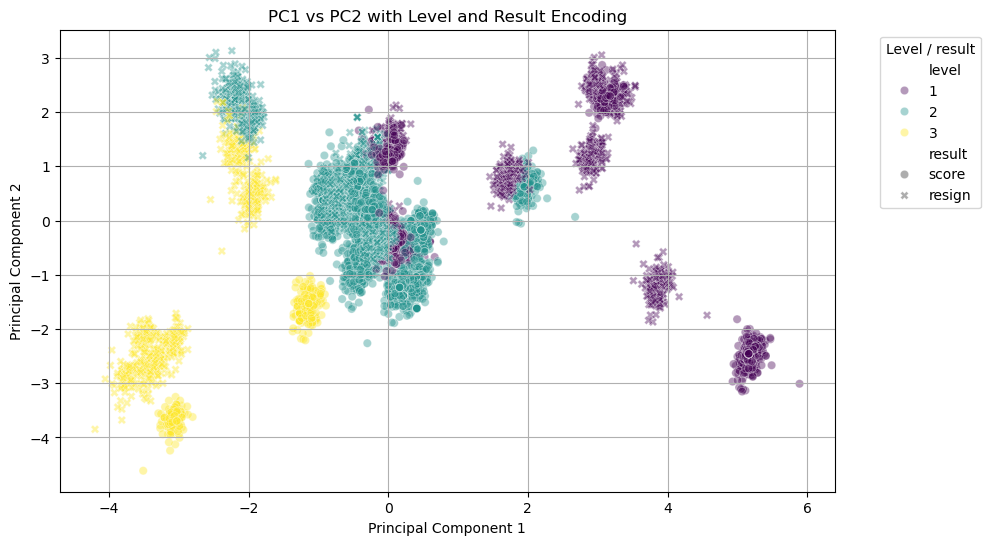

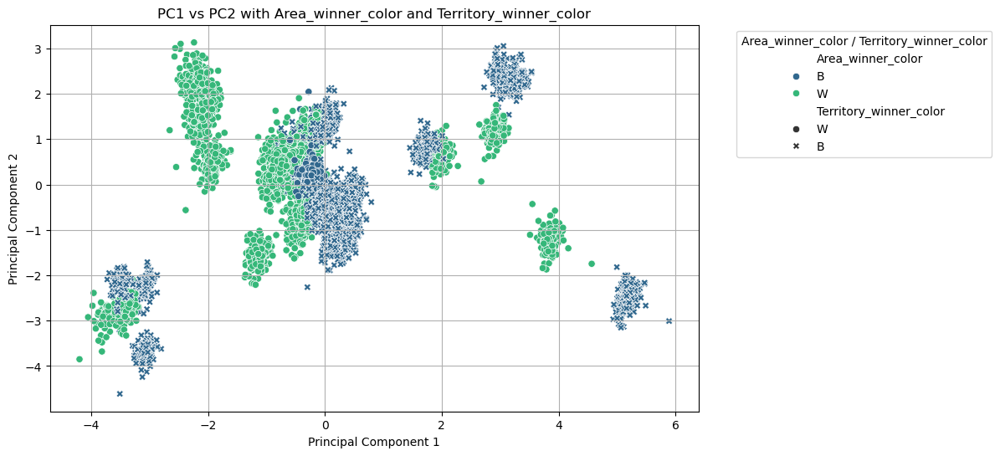

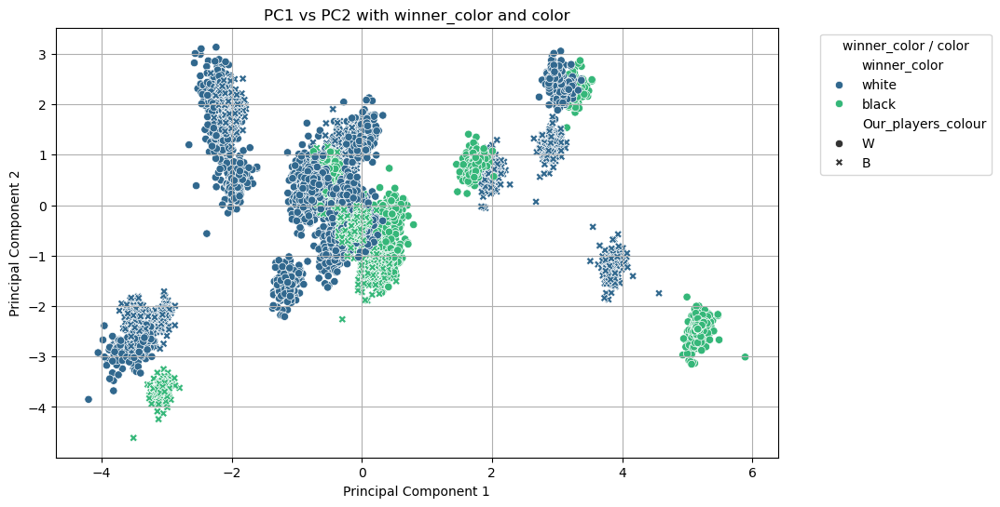

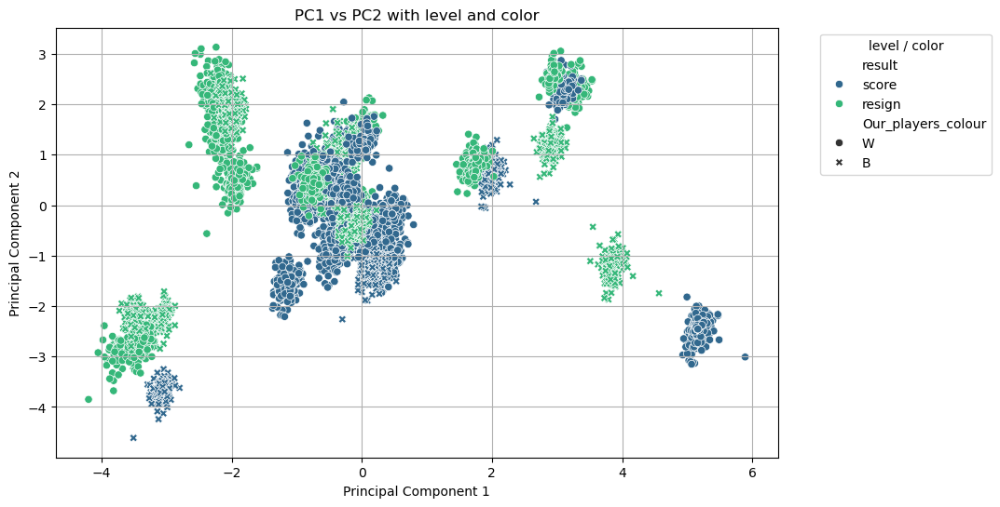

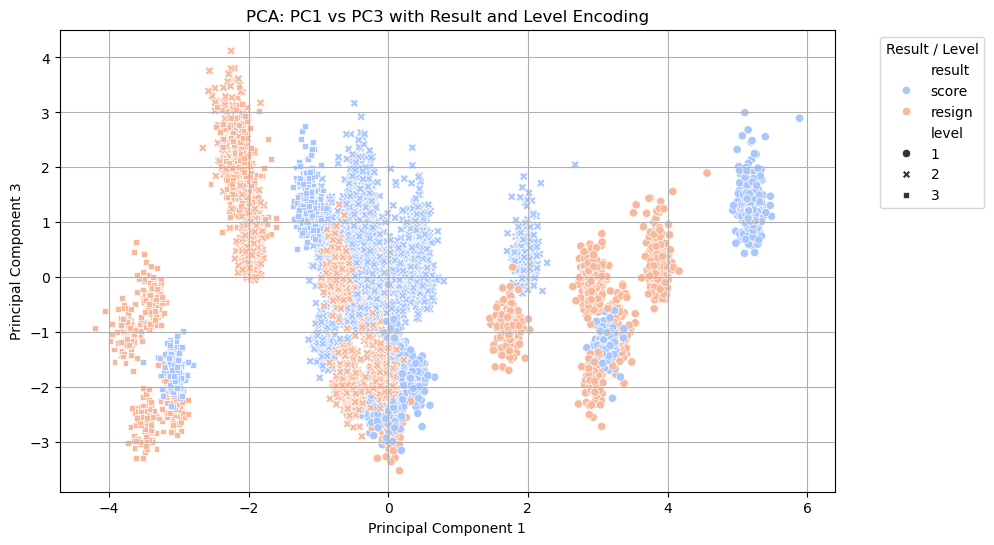

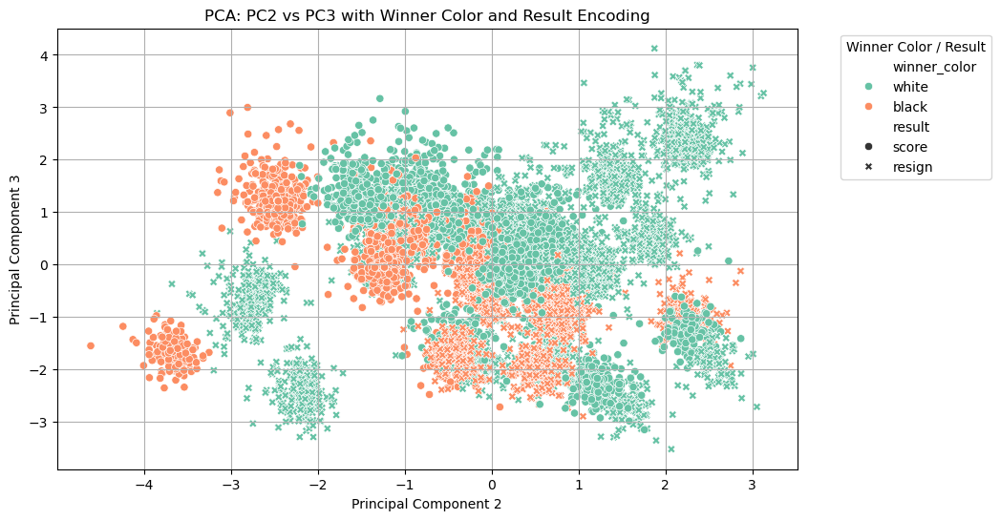

In [22]:
# 1. PCA Implementation
# ---------------------------------
"""pca = PCA(n_components=3)  # We are interested in the first 3 components
pca_components = pca.fit_transform(player_info_columns[numerical_features])

# Create a DataFrame for easy handling of PCA components
pca_df = pd.DataFrame(pca_components, columns=['PC1', 'PC2', 'PC3'])"""


# Optionally, add meta-data features for encoding
pca_df['level'] = player_info_columns['level'].values
pca_df['winner_color'] = player_info_columns['winner_color'].values
pca_df['result'] = player_info_columns['result'].values
pca_df['starter_player'] = player_info_columns['starter_player'].values
pca_df['Area_winner_color'] = player_info_columns['Area_winner_color'].values
pca_df['Territory_winner_color'] = player_info_columns['Territory_winner_color'].values
pca_df['color'] = player_info_columns['color'].values # this is the step color
pca_df['Our_players_colour'] = player_info_columns['Our_players_colour'].values 

# ---------------------------------
# 2. PCA Plots with Meta-Data Encoding
# ---------------------------------
# PC1 vs PC2
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='level', style='result', palette='viridis', alpha=0.4)
plt.title('PC1 vs PC2 with Level and Result Encoding')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Level / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Area_winner_color', style='Territory_winner_color', palette='viridis')
plt.title('PC1 vs PC2 with Area_winner_color and Territory_winner_color')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Area_winner_color / Territory_winner_color', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='winner_color', style='Our_players_colour', palette='viridis')
plt.title('PC1 vs PC2 with winner_color and color')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='winner_color / color', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='result', style='Our_players_colour', palette='viridis')
plt.title('PC1 vs PC2 with level and color')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='level / color', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# PC1 vs PC3
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC3', hue='result', style='level', palette='coolwarm')
plt.title('PCA: PC1 vs PC3 with Result and Level Encoding')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.legend(title='Result / Level', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# PC2 vs PC3
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC2', y='PC3', hue='winner_color', style='result', palette='Set2')
plt.title('PCA: PC2 vs PC3 with Winner Color and Result Encoding')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.legend(title='Winner Color / Result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

KEEP

In [23]:
fig = px.scatter_3d(pca_df, x=pca_df['PC1'], y=pca_df['PC2'], z=pca_df['PC3'],
              color=pca_df['result'])
fig.show()

# Additional column

In [24]:
player_info_columns

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,...,Date,Our_players_colour,Area score,Area score of opponent,Area_winner_color,Area_result,Territory_score,Territory_score_of_opponent,Territory_winner_color,Territory_result
0,1,1,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
1,1,2,black,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
2,1,3,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
3,1,4,black,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
4,1,5,white,white,Time,score,Japanese,4,white,105,...,"September, 2024",W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,...,2024-10-01 00:00:00,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408


# here is the code which makes the additional column, which you will need for the link states line coloring

# 3. Link states

In [25]:
def determine_phase(df):
    # Group by game_id
    df['phase'] = df.groupby('game_id')['move_id'].transform(
        lambda x: ["starter" if step <= 20 
                   else "final" if step > (x.max() - 20) 
                   else "intermediate"
                   for step in x]
    )
    return df

# Apply the function to the DataFrame
player_info_columns = determine_phase(player_info_columns)

C:\Users\lengyel1lizb08\AppData\Local\Temp\ipykernel_28784\1667704383.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [26]:
player_info_columns

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,...,Our_players_colour,Area score,Area score of opponent,Area_winner_color,Area_result,Territory_score,Territory_score_of_opponent,Territory_winner_color,Territory_result,phase
0,1,1,white,white,Time,score,Japanese,4,white,105,...,W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,starter
1,1,2,black,white,Time,score,Japanese,4,white,105,...,W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,starter
2,1,3,white,white,Time,score,Japanese,4,white,105,...,W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,starter
3,1,4,black,white,Time,score,Japanese,4,white,105,...,W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,starter
4,1,5,white,white,Time,score,Japanese,4,white,105,...,W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,starter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,...,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,final
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,...,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,final
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,...,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,final
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,...,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,final


In [27]:
pca_df

,PC1,PC2,PC3,level,winner_color,result,starter_player,Area_winner_color,Territory_winner_color,color,Our_players_colour
0,-0.315149,1.084037,-2.440193,1,white,score,white,B,W,white,W
1,-0.261118,0.954512,-2.835723,1,white,score,white,B,W,black,W
2,-0.202340,0.928186,-2.233128,1,white,score,white,B,W,white,W
3,-0.205278,1.518438,-2.884055,1,white,score,white,B,W,black,W
4,-0.240437,1.135438,-2.185350,1,white,score,white,B,W,white,W
...,...,...,...,...,...,...,...,...,...,...,...
9750,2.950732,2.775316,-1.544226,1,white,resign,white,B,B,black,W
9751,2.873393,2.413515,-1.660647,1,white,resign,white,B,B,white,W
9752,2.889475,2.509379,-1.875315,1,white,resign,white,B,B,black,W
9753,2.955435,2.618545,-1.894018,1,white,resign,white,B,B,white,W


# Liza's stuff below there

In [28]:
def visualise_clusters(labels = None, cmap = 'viridis'):
    plt.figure(figsize = (21, 3))
    plt.scatter(*X_tsne[:, :2].T, s = 10, c = labels, cmap = cmap)
    plt.show()

In [29]:
fig = px.scatter_3d(pca_df, x=pca_df.iloc[:, 0], y=pca_df.iloc[:, 1], z=pca_df.iloc[:, 2],
              color=data['level'])
fig.show()

In [30]:
fig = px.scatter_3d(pca_df, x=pca_df.iloc[:, 0], y=pca_df.iloc[:, 1], z=pca_df.iloc[:, 2],
              color=player_info_columns['phase'])
fig.show()

In [31]:
pca_components

array([[-5.07895224e-02,  1.03402196e-01, -4.07970573e-01, ...,
        -7.48226237e-02,  7.70558226e-02, -7.70558226e-02],
       [ 4.75564553e-01, -9.13468727e-02, -3.08856184e-01, ...,
         6.15364865e-02, -7.08439815e-02,  7.08439815e-02],
       [-1.57888148e-01,  6.28116038e-01,  1.23784885e-01, ...,
         2.12239585e-01, -1.96598014e-01,  1.96598014e-01],
       ...,
       [-1.25765864e-18,  4.92998985e-02,  2.84784136e-01, ...,
        -4.11473924e-02, -1.08648277e-01, -9.43705011e-02],
       [ 0.00000000e+00, -6.32282578e-02,  4.43433996e-01, ...,
        -3.76715916e-02, -2.26379771e-02,  3.52287161e-02],
       [-2.35520902e-01, -1.39389132e-02, -3.69334849e-02, ...,
         1.61254374e-01,  2.01969916e-01,  1.74522600e-01]])

C:\Users\lengyel1lizb08\AppData\Local\Temp\ipykernel_28784\619309093.py:25: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



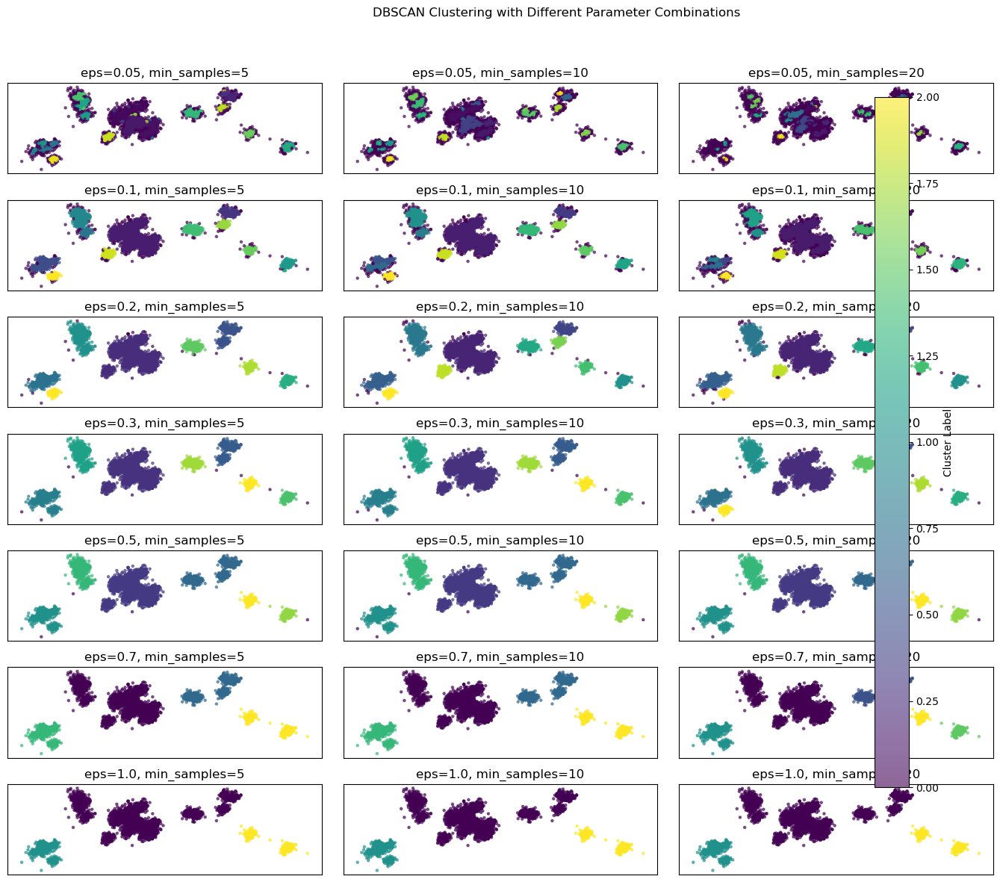

In [32]:
from sklearn.cluster import KMeans, DBSCAN
# Grid search parameters
eps_values = [0.05, 0.1, 0.2, 0.3, 0.5, 0.7, 1.0]     # Different values for epsilon
min_samples_values = [5, 10, 20]       # Different values for min_samples

fig, axes = plt.subplots(len(eps_values), len(min_samples_values), figsize=(15, 12), sharex=True, sharey=True)
fig.suptitle("DBSCAN Clustering with Different Parameter Combinations")

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        # Initialize and fit DBSCAN with the current parameters
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        clusters = dbscan.fit_predict(pca_df.iloc[:, :2])
        
        # Plot the resulting clusters in 2D t-SNE space
        ax = axes[i, j]
        scatter = ax.scatter(x=pca_df.iloc[:, 0], y=pca_df.iloc[:, 1], c=clusters, cmap='viridis', s=5, alpha=0.6)
        
        # Title for each subplot
        ax.set_title(f"eps={eps}, min_samples={min_samples}")
        ax.set_xticks([])
        ax.set_yticks([])

plt.colorbar(scatter, ax=axes, location="right", label="Cluster Label")
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()

In [33]:
pca_df.columns

Index(['PC1', 'PC2', 'PC3', 'level', 'winner_color', 'result',
       'starter_player', 'Area_winner_color', 'Territory_winner_color',
       'color', 'Our_players_colour'],
      dtype='object')

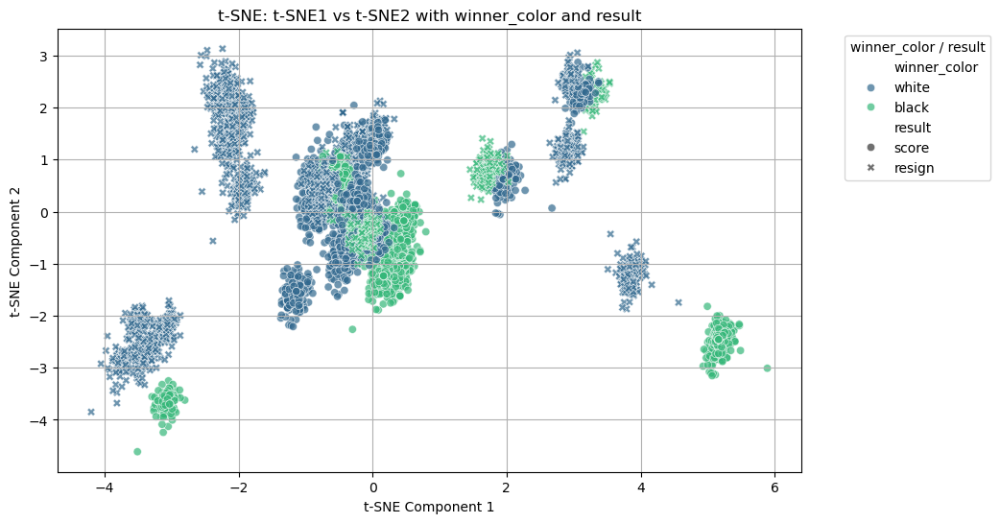

In [34]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='winner_color', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [35]:
pca_df['phase'] = player_info_columns['phase'].values
pca_df['Player']=player_info_columns['Player'].values

In [36]:
pca_df

,PC1,PC2,PC3,level,winner_color,result,starter_player,Area_winner_color,Territory_winner_color,color,Our_players_colour,phase,Player
0,-0.315149,1.084037,-2.440193,1,white,score,white,B,W,white,W,starter,FrayedKnot
1,-0.261118,0.954512,-2.835723,1,white,score,white,B,W,black,W,starter,FrayedKnot
2,-0.202340,0.928186,-2.233128,1,white,score,white,B,W,white,W,starter,FrayedKnot
3,-0.205278,1.518438,-2.884055,1,white,score,white,B,W,black,W,starter,FrayedKnot
4,-0.240437,1.135438,-2.185350,1,white,score,white,B,W,white,W,starter,FrayedKnot
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,2.950732,2.775316,-1.544226,1,white,resign,white,B,B,black,W,final,tmat
9751,2.873393,2.413515,-1.660647,1,white,resign,white,B,B,white,W,final,tmat
9752,2.889475,2.509379,-1.875315,1,white,resign,white,B,B,black,W,final,tmat
9753,2.955435,2.618545,-1.894018,1,white,resign,white,B,B,white,W,final,tmat


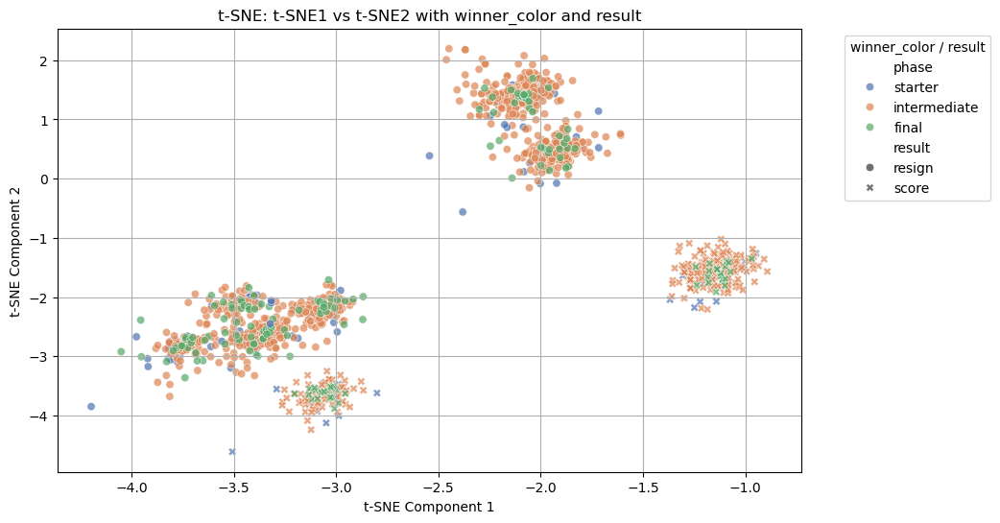

In [37]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df[pca_df['level']==3], x='PC1', y='PC2', hue='phase', style='result', alpha=0.7, palette='deep')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

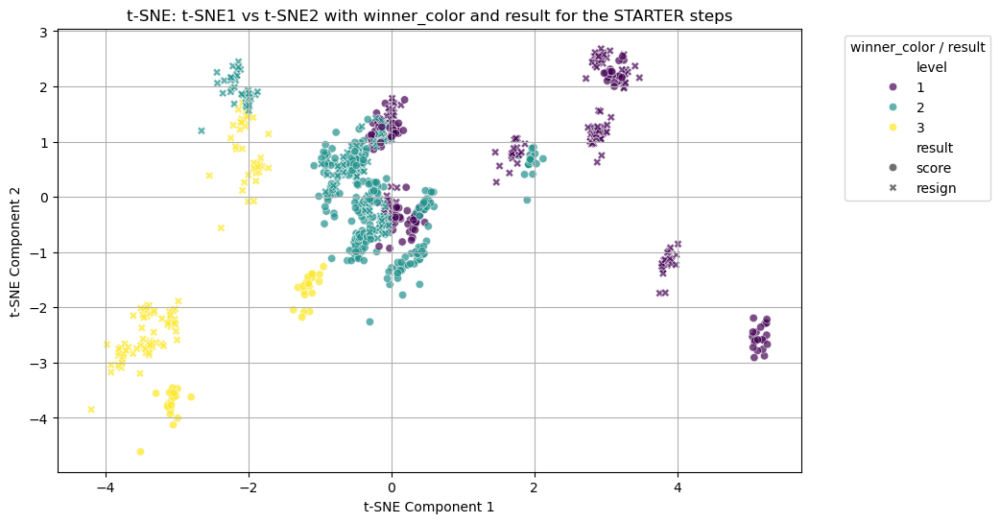

In [38]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df.query('phase == "starter"'), x='PC1', y='PC2', hue='level', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result for the STARTER steps')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

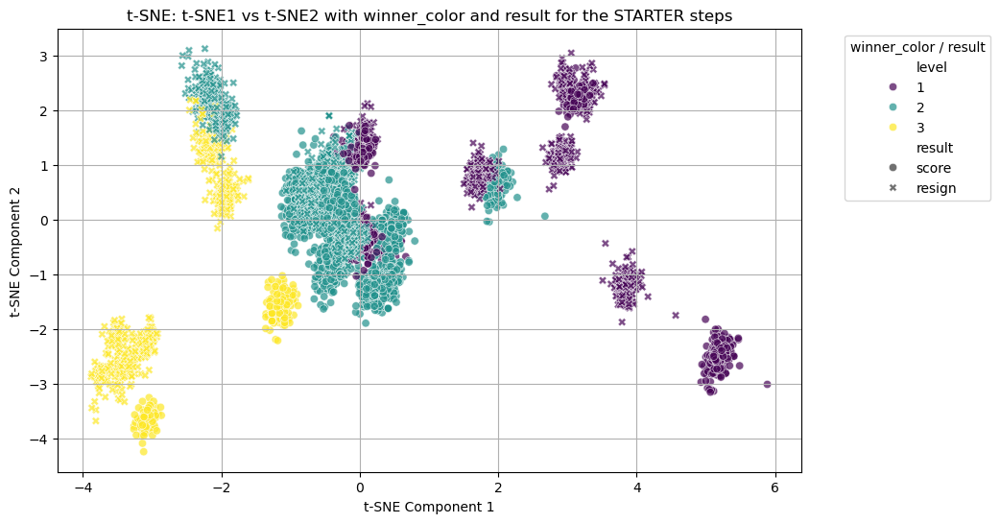

In [39]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df.query('phase == "intermediate"'), x='PC1', y='PC2', hue='level', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result for the STARTER steps')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

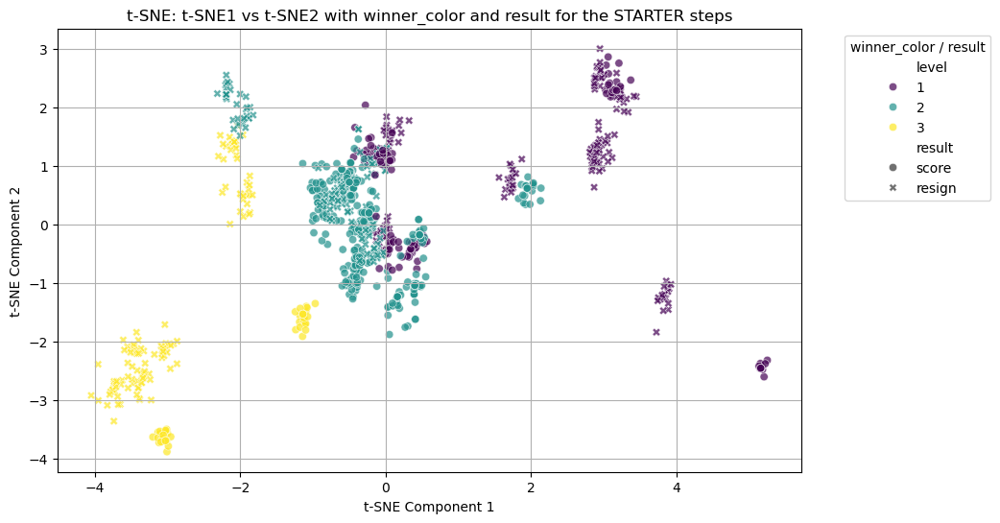

In [40]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df.query('phase == "final"'), x='PC1', y='PC2', hue='level', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result for the STARTER steps')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [41]:
pca_df.query('phase == "intermediate"')

,PC1,PC2,PC3,level,winner_color,result,starter_player,Area_winner_color,Territory_winner_color,color,Our_players_colour,phase,Player
20,-0.251254,1.103865,-2.425805,1,white,score,white,B,W,white,W,intermediate,FrayedKnot
21,-0.112157,1.165757,-2.485671,1,white,score,white,B,W,black,W,intermediate,FrayedKnot
22,-0.219093,1.235063,-2.124974,1,white,score,white,B,W,white,W,intermediate,FrayedKnot
23,-0.174930,1.249843,-2.480070,1,white,score,white,B,W,black,W,intermediate,FrayedKnot
24,-0.324320,1.029054,-2.238078,1,white,score,white,B,W,white,W,intermediate,FrayedKnot
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9730,3.038705,2.497124,-2.323047,1,white,resign,white,B,B,black,W,intermediate,tmat
9731,2.914004,2.551025,-1.912892,1,white,resign,white,B,B,white,W,intermediate,tmat
9732,3.031302,2.759496,-2.058129,1,white,resign,white,B,B,black,W,intermediate,tmat
9733,2.955602,2.629050,-1.870370,1,white,resign,white,B,B,white,W,intermediate,tmat


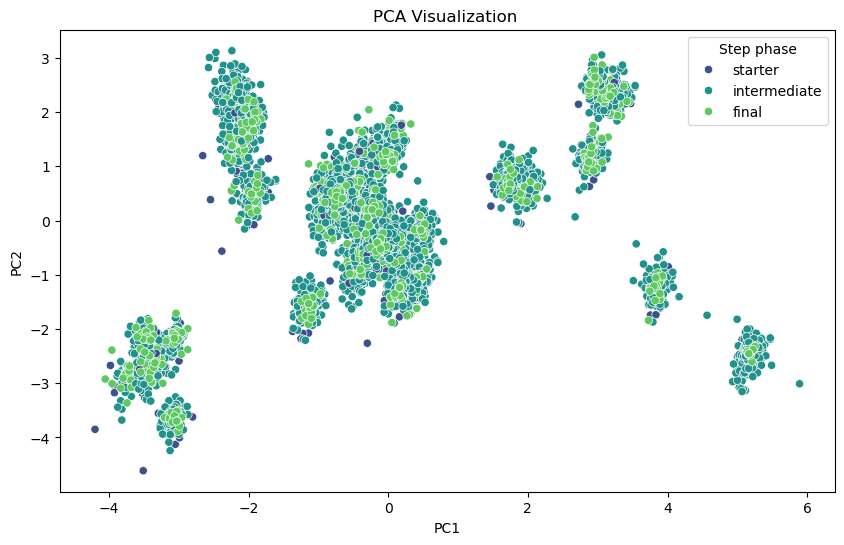

In [42]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df.iloc[:, 0], y=pca_df.iloc[:, 1], hue=player_info_columns['phase'], palette='viridis')
plt.title(f'PCA Visualization ')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='Step phase')
plt.show()

In [43]:
player_info_columns

,game_id,move_id,color,winner_color,winner_score,result,rules,handicap,starter_player,step_count,...,Our_players_colour,Area score,Area score of opponent,Area_winner_color,Area_result,Territory_score,Territory_score_of_opponent,Territory_winner_color,Territory_result,phase
0,1,1,white,white,Time,score,Japanese,4,white,105,...,W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,starter
1,1,2,black,white,Time,score,Japanese,4,white,105,...,W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,starter
2,1,3,white,white,Time,score,Japanese,4,white,105,...,W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,starter
3,1,4,black,white,Time,score,Japanese,4,white,105,...,W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,starter
4,1,5,white,white,Time,score,Japanese,4,white,105,...,W,54.5,56.0,B,134.842514,4.5,3.0,W,137.831408,starter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9750,44,86,black,white,NaN,resign,Japanese,5,white,90,...,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,final
9751,44,87,white,white,NaN,resign,Japanese,5,white,90,...,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,final
9752,44,88,black,white,NaN,resign,Japanese,5,white,90,...,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,final
9753,44,89,white,white,NaN,resign,Japanese,5,white,90,...,W,0.5,361.0,B,134.842514,0.5,356.0,B,137.831408,final


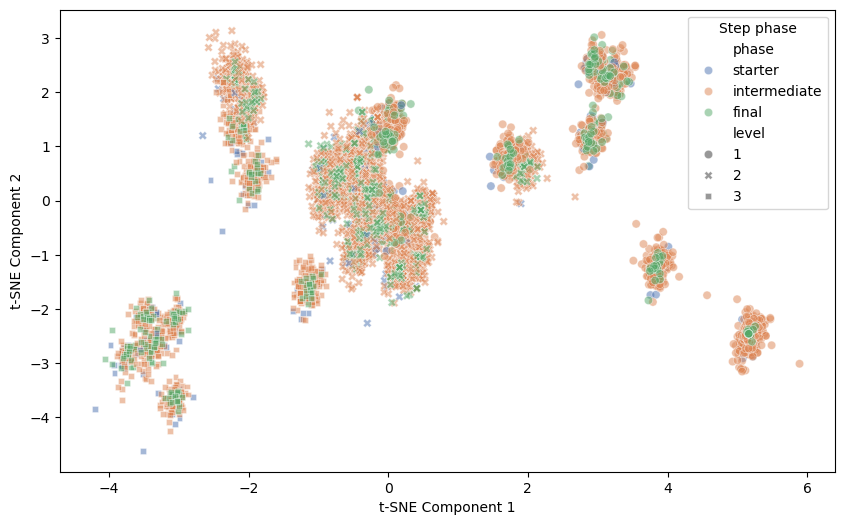

In [44]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df.iloc[:, 0], y=pca_df.iloc[:, 1], hue=pca_df['phase'], style=pca_df['level'], palette='deep', alpha=0.5)

plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Step phase')
plt.show()

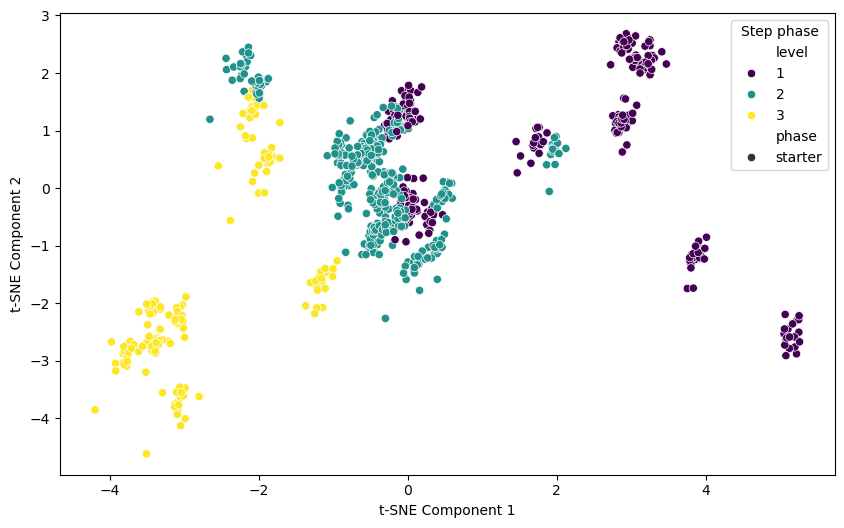

In [45]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df.query('phase == "starter" ') ,x='PC1', y='PC2', hue='level', style='phase', palette='viridis')

plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Step phase')
plt.show()

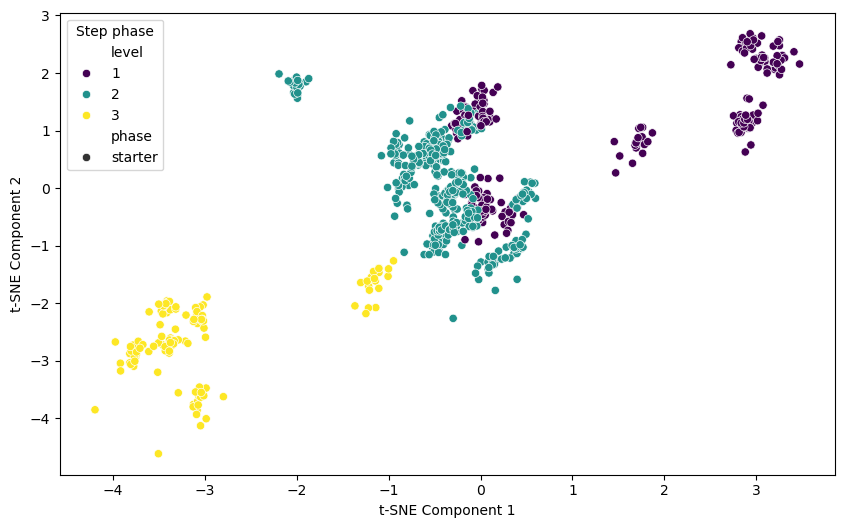

In [46]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df.query('phase == "starter" & Player != "mangochia"') ,x='PC1', y='PC2', hue='level', style='phase', palette='viridis')

plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Step phase')
plt.show()

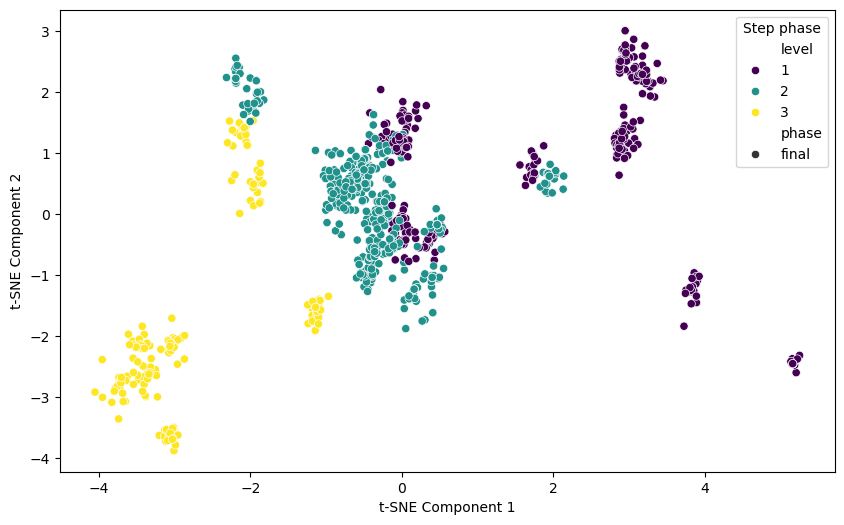

In [47]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df.query('phase == "final"') ,x='PC1', y='PC2', hue='level', style='phase', palette='viridis')

plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Step phase')
plt.show()

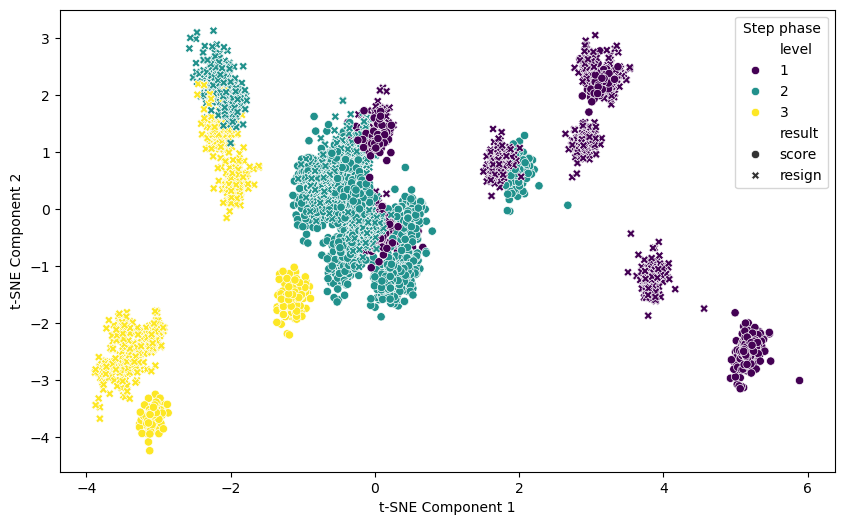

In [48]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df.query('phase == "intermediate"') ,x='PC1', y='PC2', hue='level', style='result', palette='viridis')

plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Step phase')
plt.show()

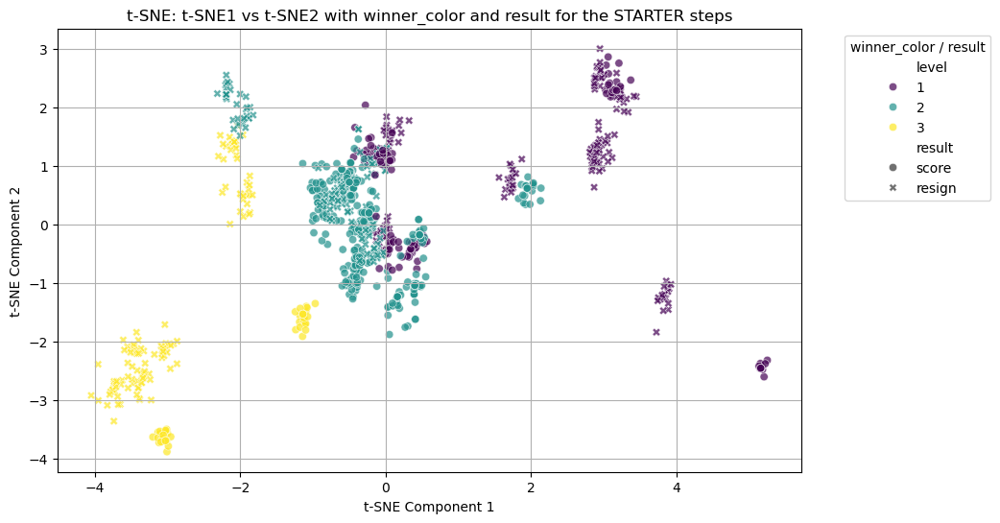

In [49]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df.query('phase == "final"'), x='PC1', y='PC2', hue='level', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result for the STARTER steps')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

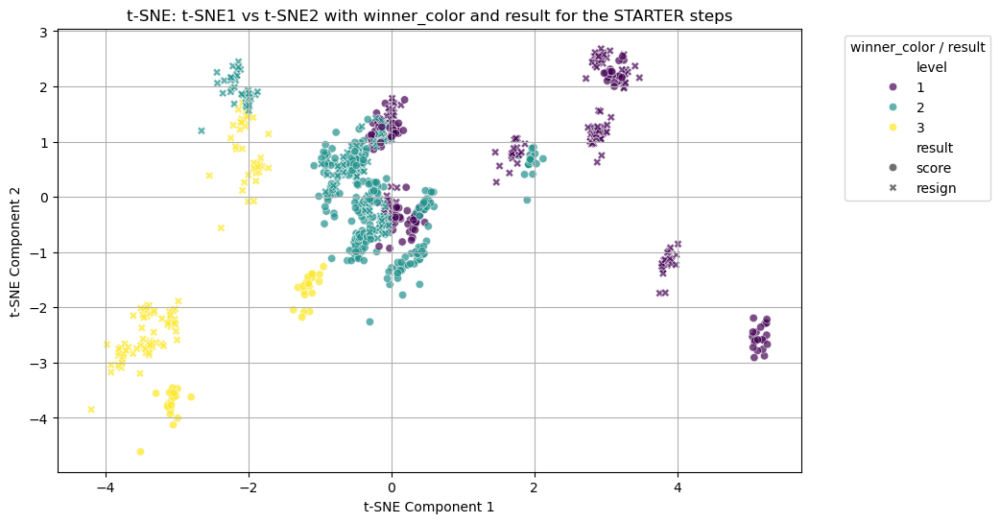

In [50]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df.query('phase == "starter"'), x='PC1', y='PC2', hue='level', style='result', alpha=0.7, palette='viridis')
plt.title('t-SNE: t-SNE1 vs t-SNE2 with winner_color and result for the STARTER steps')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='winner_color / result', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [51]:
fig = px.scatter_3d(pca_df.query('phase == "starter" & Player != "mangochia"'), x=pca_df.iloc[:,0], y=pca_df.iloc[:,1], z=pca_df.iloc[:,2],
              color=pca_df['level'])
fig.show()

In [52]:
fig = px.scatter_3d(pca_df.query('level == 1 & Player != "mangochia"'), x=pca_df.iloc[:,0], y=pca_df.iloc[:,1], z=pca_df.iloc[:,2],
              color=pca_df['phase'], opacity= 0.4)
fig.show()